In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import  KNNImputer,SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn import decomposition, preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import shapiro
from scipy.stats import spearmanr
from scipy.stats import kruskal

In [2]:
#produits_france
def produits_fr(df):
    countries = df["countries_fr"].unique().tolist()
    countries = ['missing' if x is np.nan else x for x in countries]
    fr_countries = [i for i in countries if "France" in i]
    return df[df["countries_fr"].isin(fr_countries)]

In [3]:
#incoherence 
def remove_incoherence(data, variable1, variable2):
    incoherence = data[data[variable1] > data[variable2]]
    data.drop(incoherence.index, inplace=True)

In [4]:
#imputation nutri_grade
def determine_grade(nutrition_score):
    if pd.notna(nutrition_score):
        if nutrition_score >= 0 and nutrition_score <= 2:
            return 'A'
        elif nutrition_score >= 3 and nutrition_score <= 10:
            return 'B'
        elif nutrition_score >= 11 and nutrition_score <= 18:
            return 'C'
        elif nutrition_score >= 19 and nutrition_score <= 26:
            return 'D'
        else:
            return 'E'
    else:
        return None

# Explorations des jeux de donnèes

In [5]:
food = pd.read_csv('fr.openfoodfacts.org.products.csv',delimiter='\t',  encoding='utf-8')
food.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
food.shape

(320772, 162)

In [7]:
food.describe()

,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,nutrition_grade_uk,energy_100g,energy-from-fat_100g,fat_100g,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,248939.000000,0.0,0.0,2.611130e+05,857.000000,243891.000000,...,49.000000,3036.000000,165.000000,948.000000,0.0,268.000000,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,0.055246,NaN,NaN,1.141915e+03,585.501214,12.730379,...,6.425698,31.458587,15.412121,49.547785,NaN,341.700764,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,0.269207,NaN,NaN,6.447154e+03,712.809943,17.578747,...,2.047841,31.967918,3.753028,18.757932,NaN,425.211439,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,0.000000e+00,0.000000,0.000000,...,0.000000,0.000000,8.000000,6.000000,NaN,0.000000,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,3.770000e+02,49.400000,0.000000,...,6.300000,0.000000,12.000000,32.000000,NaN,98.750000,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,0.000000,NaN,NaN,1.100000e+03,300.000000,5.000000,...,7.200000,23.000000,15.000000,50.000000,NaN,195.750000,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,0.000000,NaN,NaN,1.674000e+03,898.000000,20.000000,...,7.400000,51.000000,15.000000,64.250000,NaN,383.200000,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,6.000000,NaN,NaN,3.251373e+06,3830.000000,714.290000,...,8.400000,100.000000,25.000000,100.000000,NaN,2842.000000,40.000000,40.000000,NaN,NaN


In [8]:
food.isnull().sum()

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64

In [9]:
food.duplicated().sum()

0

In [10]:
# Affichage des divers types des colonnes du dataset
food.dtypes.value_counts()

float64    106
object      56
dtype: int64

In [11]:
#Variables qualitatives
food.select_dtypes(include=['object']).columns.tolist()

['code',
 'url',
 'creator',
 'created_t',
 'created_datetime',
 'last_modified_t',
 'last_modified_datetime',
 'product_name',
 'generic_name',
 'quantity',
 'packaging',
 'packaging_tags',
 'brands',
 'brands_tags',
 'categories',
 'categories_tags',
 'categories_fr',
 'origins',
 'origins_tags',
 'manufacturing_places',
 'manufacturing_places_tags',
 'labels',
 'labels_tags',
 'labels_fr',
 'emb_codes',
 'emb_codes_tags',
 'first_packaging_code_geo',
 'cities',
 'cities_tags',
 'purchase_places',
 'stores',
 'countries',
 'countries_tags',
 'countries_fr',
 'ingredients_text',
 'allergens',
 'allergens_fr',
 'traces',
 'traces_tags',
 'traces_fr',
 'serving_size',
 'additives',
 'additives_tags',
 'additives_fr',
 'ingredients_from_palm_oil_tags',
 'ingredients_that_may_be_from_palm_oil_tags',
 'nutrition_grade_fr',
 'pnns_groups_1',
 'pnns_groups_2',
 'states',
 'states_tags',
 'states_fr',
 'main_category',
 'main_category_fr',
 'image_url',
 'image_small_url']

In [12]:
#Variables quantitatives
food.select_dtypes(include=['float64']).columns.tolist()

['no_nutriments',
 'additives_n',
 'ingredients_from_palm_oil_n',
 'ingredients_from_palm_oil',
 'ingredients_that_may_be_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil',
 'nutrition_grade_uk',
 'energy_100g',
 'energy-from-fat_100g',
 'fat_100g',
 'saturated-fat_100g',
 'butyric-acid_100g',
 'caproic-acid_100g',
 'caprylic-acid_100g',
 'capric-acid_100g',
 'lauric-acid_100g',
 'myristic-acid_100g',
 'palmitic-acid_100g',
 'stearic-acid_100g',
 'arachidic-acid_100g',
 'behenic-acid_100g',
 'lignoceric-acid_100g',
 'cerotic-acid_100g',
 'montanic-acid_100g',
 'melissic-acid_100g',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'omega-3-fat_100g',
 'alpha-linolenic-acid_100g',
 'eicosapentaenoic-acid_100g',
 'docosahexaenoic-acid_100g',
 'omega-6-fat_100g',
 'linoleic-acid_100g',
 'arachidonic-acid_100g',
 'gamma-linolenic-acid_100g',
 'dihomo-gamma-linolenic-acid_100g',
 'omega-9-fat_100g',
 'oleic-acid_100g',
 'elaidic-acid_100g',
 'gondoic-acid_100g',
 'mead-aci

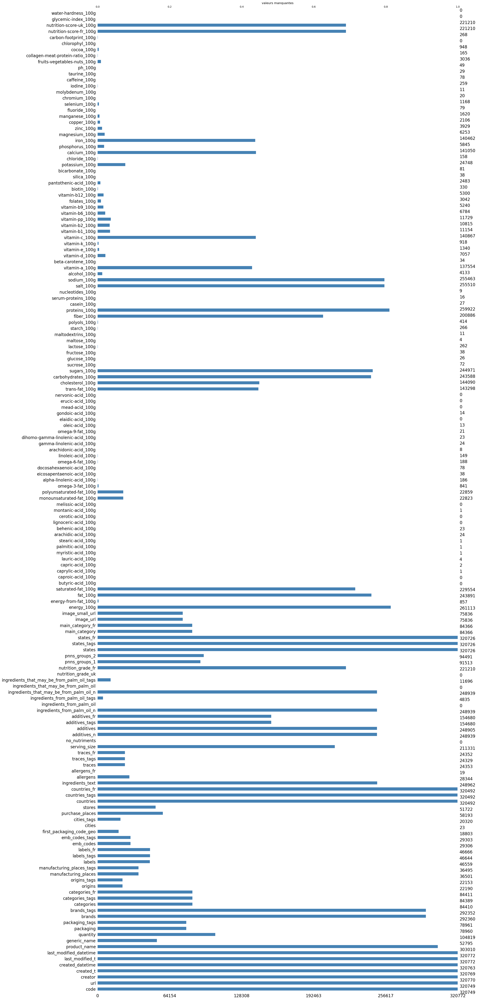

In [13]:
# la fonction msno.bar pour afficher les valeurs manquantes
msno.bar(food, color='steelblue')

plt.title("valeurs manquantes")

plt.show()

In [14]:
#  la liste des colonnes se terminant par '100g'
columns_100 = [col for col in food.columns if col.endswith('100g')]
# Ajout d'autres colonnes spécifiques à la liste columns_100
columns_100 += ["product_name", "countries_fr",'pnns_groups_1','ingredients_text','allergens','nutrition_grade_fr']

#  la liste combinée
columns_100

['energy_100g',
 'energy-from-fat_100g',
 'fat_100g',
 'saturated-fat_100g',
 'butyric-acid_100g',
 'caproic-acid_100g',
 'caprylic-acid_100g',
 'capric-acid_100g',
 'lauric-acid_100g',
 'myristic-acid_100g',
 'palmitic-acid_100g',
 'stearic-acid_100g',
 'arachidic-acid_100g',
 'behenic-acid_100g',
 'lignoceric-acid_100g',
 'cerotic-acid_100g',
 'montanic-acid_100g',
 'melissic-acid_100g',
 'monounsaturated-fat_100g',
 'polyunsaturated-fat_100g',
 'omega-3-fat_100g',
 'alpha-linolenic-acid_100g',
 'eicosapentaenoic-acid_100g',
 'docosahexaenoic-acid_100g',
 'omega-6-fat_100g',
 'linoleic-acid_100g',
 'arachidonic-acid_100g',
 'gamma-linolenic-acid_100g',
 'dihomo-gamma-linolenic-acid_100g',
 'omega-9-fat_100g',
 'oleic-acid_100g',
 'elaidic-acid_100g',
 'gondoic-acid_100g',
 'mead-acid_100g',
 'erucic-acid_100g',
 'nervonic-acid_100g',
 'trans-fat_100g',
 'cholesterol_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'sucrose_100g',
 'glucose_100g',
 'fructose_100g',
 'lactose_100g',
 'ma

In [15]:
#columns_100 += ["product_name", "countries_fr"]
#on Filtre le DataFrame pour ne garder que les colonnes de la liste columns_100
food_filtrer = food.loc[:, columns_100]
food_filtrer.head()

,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,...,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g,product_name,countries_fr,pnns_groups_1,ingredients_text,allergens,nutrition_grade_fr
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Farine de blé noir,France,NaN,NaN,NaN,NaN
1,2243.0,NaN,28.57,28.57,NaN,NaN,NaN,NaN,NaN,NaN,...,14.0,14.0,NaN,NaN,Banana Chips Sweetened (Whole),États-Unis,NaN,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,d
2,1941.0,NaN,17.86,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,NaN,Peanuts,États-Unis,NaN,"Peanuts, wheat flour, sugar, rice flour, tapio...",NaN,b
3,2540.0,NaN,57.14,5.36,NaN,NaN,NaN,NaN,NaN,NaN,...,12.0,12.0,NaN,NaN,Organic Salted Nut Mix,États-Unis,NaN,"Organic hazelnuts, organic cashews, organic wa...",NaN,d
4,1552.0,NaN,1.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Organic Polenta,États-Unis,NaN,Organic polenta,NaN,NaN


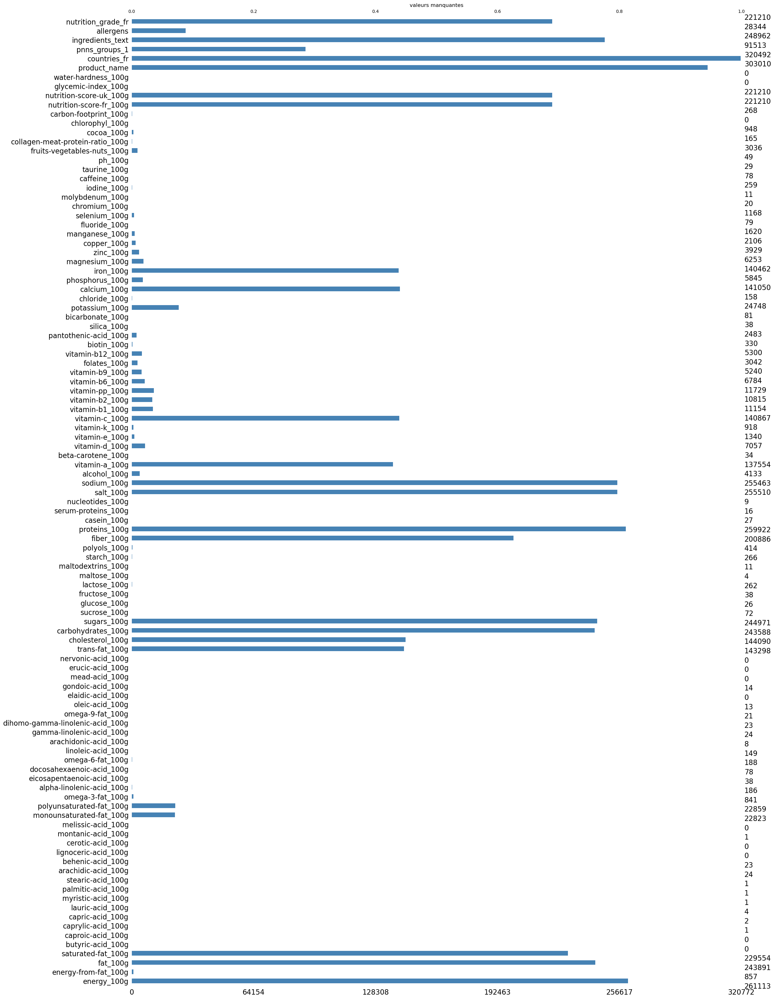

In [16]:
# la fonction msno.bar pour afficher les valeurs manquantes
msno.bar(food_filtrer, color='steelblue')

plt.title("valeurs manquantes")

plt.show()

In [17]:
food_filtrer.shape

(320772, 105)

In [18]:
# Calculer le pourcentage de valeurs nulles par colonne
null_ratio = (food_filtrer.isnull().sum() / len(food_filtrer)) * 100

# Filtrer les colonnes avec plus de 50% de valeurs nulles
columns_to_drop = null_ratio[null_ratio > 50].index

# Supprimer ces colonnes du DataFrame
food2 = food_filtrer.drop(columns=columns_to_drop)

# Afficher les informations sur le DataFrame après suppression des colonnes
food2.shape

(320772, 15)

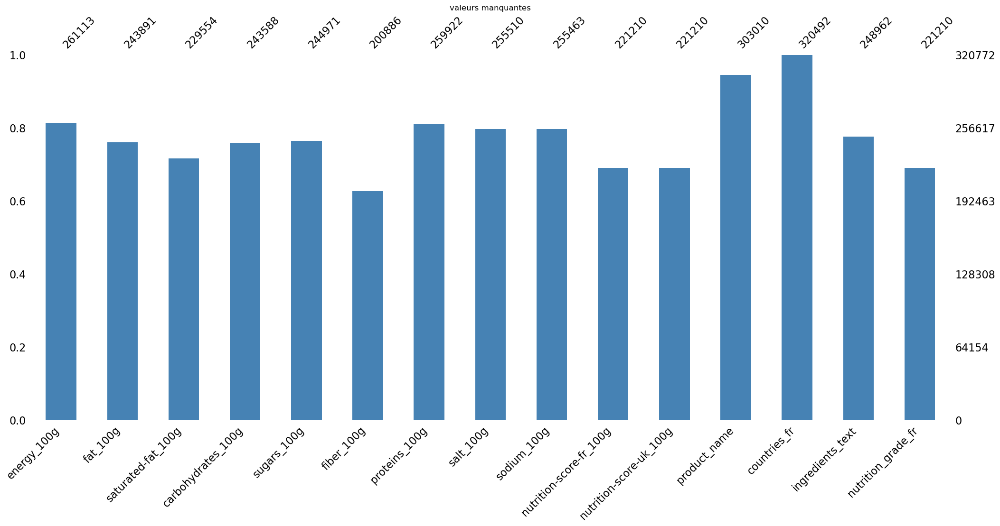

In [19]:
# la fonction msno.bar pour afficher les valeurs manquantes
msno.bar(food2, color='steelblue')

plt.title("valeurs manquantes")

plt.show()

In [20]:
## on filtre sur la france 
food_france = produits_fr(food2)
food_france.drop(columns=['nutrition-score-uk_100g'], inplace=True)
food_france.drop(columns=['ingredients_text','countries_fr'], inplace=True)

In [21]:
rows_with_nan = food_france[food_france.isna().any(axis=1)]
rows_with_nan

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,product_name,nutrition_grade_fr
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Farine de blé noir,NaN
46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filet de bœuf,NaN
48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Twix x2,NaN
138,1481.0,4.17,NaN,77.08,NaN,6.2,6.25,NaN,NaN,NaN,Pack de 2 Twix,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
320760,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Poireaux,NaN
320761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Roussette du Bugey (2011),NaN
320764,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Cheese cake thé vert, yuzu",NaN
320765,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rillette d'oie,NaN


In [22]:
# Supprimer les lignes avec un nombre élevé de valeurs manquantes (par exemple, supprimer les lignes avec plus de 5 valeurs manquantes)
seuil_valeurs_manquantes = 3
food_france = food_france.dropna(thresh=food_france.shape[1] - seuil_valeurs_manquantes)

# Afficher le DataFrame résultant
food_france

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,product_name,nutrition_grade_fr
106,1883.0,20.0,12.50,70.0,57.50,2.5,2.50,0.09652,0.038000,22.0,Lion Peanut x2,e
190,1753.0,NaN,0.80,NaN,87.70,0.9,0.60,0.01000,0.003937,14.0,Mini Confettis,d
191,2406.0,NaN,2.90,NaN,50.30,3.9,9.50,0.00300,0.001181,14.0,Praliné Amande Et Noisette,d
226,177.0,0.0,0.00,10.4,10.40,0.0,0.00,0.02540,0.010000,13.0,"Pepsi, Nouveau goût !",e
234,1079.0,NaN,11.00,NaN,1.00,1.4,7.50,0.80000,0.314961,15.0,Tarte Poireaux Et Lardons,d
...,...,...,...,...,...,...,...,...,...,...,...,...
320740,1084.0,NaN,12.00,NaN,10.50,0.0,8.70,0.29000,0.114173,16.0,Verrine Cheescake Myrtille,d
320741,4.0,NaN,1.00,NaN,1.00,10.0,10.00,10.00000,3.937008,0.0,Fiche Brevet,b
320751,1643.0,2.8,0.60,74.8,2.60,5.9,13.00,0.68000,0.267717,-4.0,Tartines craquantes bio au sarrasin,a
320757,2406.0,NaN,3.73,NaN,3.89,12.2,21.22,0.10000,0.039370,0.0,Amandes,b


In [23]:
food_france['product_name'].duplicated().sum()

10379

In [24]:
food_france.shape

(61905, 12)

# Outliers 

In [25]:
food_france.describe()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,6.189400e+04,44775.000000,61799.000000,44724.000000,61836.000000,45316.000000,61865.000000,61905.000000,61904.000000,61334.000000
mean,1.179211e+03,13.271325,5.422710,27.822707,13.369612,2.546683,7.733389,1.141010,0.449223,8.694851
std,1.311170e+04,16.764267,8.536009,27.278783,19.006561,4.613365,7.842251,4.135862,1.628245,9.046375
min,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,4.320000e+02,1.300000,0.300000,4.200000,1.000000,0.000000,1.800000,0.080000,0.031496,1.000000
50%,1.039500e+03,6.900000,2.000000,14.900000,4.000000,1.300000,6.000000,0.560000,0.220472,9.000000
75%,1.657000e+03,21.000000,7.400000,53.000000,17.700000,3.200000,10.800000,1.240000,0.488189,15.000000
max,3.251373e+06,380.000000,210.000000,190.000000,104.000000,178.000000,100.000000,211.000000,83.000000,40.000000


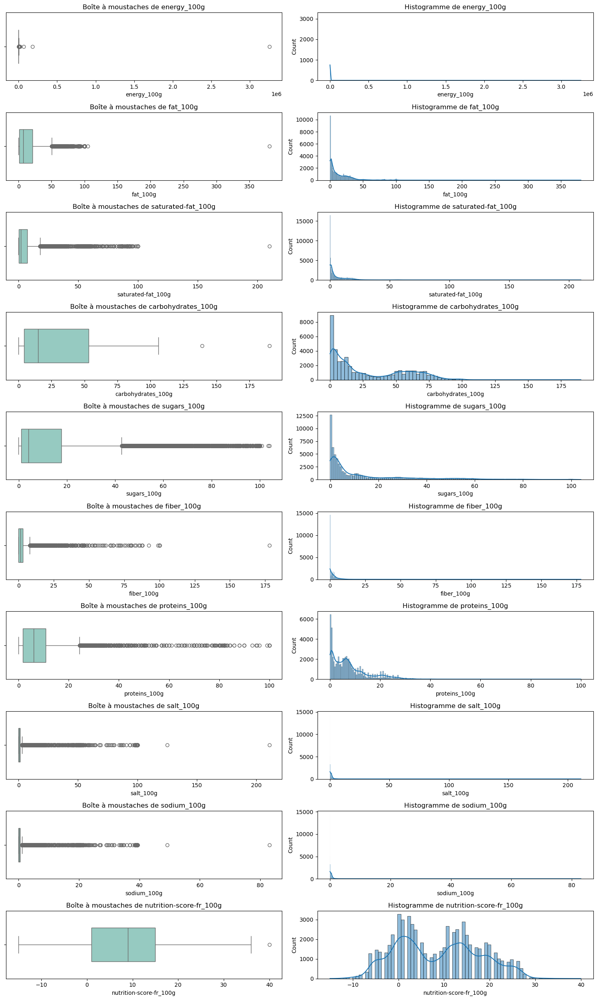

In [26]:
indicateurs = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g','fiber_100g','proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

fig, axes = plt.subplots(nrows=len(indicateurs), ncols=2, figsize=(15, 25))

for i, indicateur in enumerate(indicateurs):
    sns.boxplot(food_france[indicateur], width=0.5, orient='h', palette='Set3', ax=axes[i, 0])
    axes[i, 0].set_title(f'Boîte à moustaches de {indicateur}', fontsize=12)
    
    sns.histplot(food_france[indicateur], kde=True, palette='Set3', ax=axes[i, 1])
    axes[i, 1].set_title(f'Histogramme de {indicateur}', fontsize=12)

plt.tight_layout()
plt.show()


## valeurs aberantes nutriments_100g

### Approche du métier 


Pour les valeurs qui doivent être entre 0 et 100g, toute valeur négative ou supérieure à 100g pourrait être considérée comme aberrante. Nous allons donc les supprimer .
Nous allons exclure la feature 'energy_100g' car celle ci est généralement exprimée en kilocalories (kcal) ou en kilojoules (kJ), et non en grammes, et 'nutrition-score-fr_100g'


In [27]:
for col in ['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
            'sugars_100g', 'fiber_100g', 'proteins_100g',
            'salt_100g', 'sodium_100g']:
    
    # Compter le nombre de valeurs aberrantes
    num_aberrant_values = food_france[(food_france[col] > 100) | (food_france[col] < 0)].shape[0]
    
    print(f'Suppression de {num_aberrant_values} valeurs aberrantes dans la colonne {col}')
    
    # Supprimer les lignes avec des valeurs aberrantes directement dans food_france
    food_france.drop(index=food_france[(food_france[col] > 100) | (food_france[col] < 0)].index, inplace=True)


Suppression de 2 valeurs aberrantes dans la colonne fat_100g
Suppression de 0 valeurs aberrantes dans la colonne saturated-fat_100g
Suppression de 5 valeurs aberrantes dans la colonne carbohydrates_100g
Suppression de 1 valeurs aberrantes dans la colonne sugars_100g
Suppression de 1 valeurs aberrantes dans la colonne fiber_100g
Suppression de 0 valeurs aberrantes dans la colonne proteins_100g
Suppression de 2 valeurs aberrantes dans la colonne salt_100g
Suppression de 0 valeurs aberrantes dans la colonne sodium_100g


## valeurs aberantes energy_100g , 'nutrition-score-fr_100g'

### Approche de l'interquartile (IQR)

In [28]:
outliers_par_indicateur = {}  # Dictionnaire pour stocker les produits avec des outliers pour chaque indicateur
indicateurs = ['energy_100g']
for indicateur in indicateurs:
    q1 = food_france[indicateur].quantile(0.25)
    q3 = food_france[indicateur].quantile(0.75)
    iqr = q3 - q1

    # Calcul des limites inférieure et supérieure pour les outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Sélection des outliers pour l'indicateur actuel
    indicator_outliers = food_france[(food_france[indicateur] < lower_bound) | (food_france[indicateur] > upper_bound)]
    
    # Obtenir les produits avec des outliers pour l'indicateur actuel
    outliers = indicator_outliers[['product_name', indicateur]]
    outliers_par_indicateur[indicateur] = outliers

# Affichage des produits contenant des outliers pour chaque indicateur
for indicateur, outliers in outliers_par_indicateur.items():
    print(f"Produits avec outliers pour l'indicateur {indicateur}:")
    print(outliers)


Produits avec outliers pour l'indicateur energy_100g:
                                   product_name  energy_100g
56561                             Tawny' Orange       5054.0
68125     Beurre D'arachide (sans Sel Ni Sucre)       3766.0
115021      Huile d'Olive Vierge Extra Classico       3700.0
115370                       extra virgin cocos       3768.0
128246                                      NaN       3766.0
...                                         ...          ...
315860  Huile de coco inodore - BioWise - 400 g       3766.0
316993                       virgin coconut oil       3766.0
317235                 Dee Thai Huile De Sésame       3766.0
319695                                     Miel       5925.0
320561                   Chicken Cup Of Noodles       4602.0

[444 rows x 2 columns]


 ### Approche du métier

D'après nos recherches sur Internet, nous savons que la valeur énergétique la plus élevée pour 100 grammes d'aliment est de 3765,6 kJ (huile d'olive). Par conséquent, nous allons utiliser une approche métier pour détecter les valeurs aberrantes

In [29]:
# Sélectionner les produits avec des valeurs de "energy_100g" supérieures à 3800
high_energy_products = food_france.loc[food_france['energy_100g'] > 3800]

# Afficher les produits sélectionnés
high_energy_products[['product_name', 'energy_100g']]


,product_name,energy_100g
56561,Tawny' Orange,5054.0
161426,Huile d'avocat,3883.0
178567,Confiserie Firenze Apfel Streuselkuchen Tiefge...,4197.0
178787,Halva with Almonds,9983.0
179179,Lot De 4 Baguettes,4184.0
...,...,...
304297,Gnocchi E Pasta Fresca,4828.0
305223,Miel D'eucalyptus,5749.0
313852,Cornetto Mini X8 Fruit,5644.0
319695,Miel,5925.0


In [30]:
food_france.shape

(61894, 12)

In [31]:
# Sélectionner les indices des lignes correspondant aux produits avec des valeurs de "energy_100g" supérieures à 3800
high_energy_indices = food_france.loc[food_france['energy_100g'] > 3800].index

# Supprimer les lignes ayant des valeurs de "energy_100g" supérieures à 3800
food_france = food_france.drop(high_energy_indices)
food_france.shape

(61805, 12)

### Controle cohérence 

Les sucres sont une catégorie de carbohydrate, mais pas la seule. La quantité totale de carbohydrate dans un aliment est égale à la somme de la quantité de sucres, de l'amidon et des fibres alimentaires. Par conséquent, il est impossible que la quantité de sucres soit supérieure ou égale à la quantité totale de carbohydrate. Pour éviter les erreurs, il est nécessaire de vérifier que la quantité de sucres est inférieure à la quantité totale de carbohydrate.

In [32]:
incoherence_sugar = food_france[food_france['sugars_100g'] > food_france['carbohydrates_100g']]
food_france.drop(incoherence_sugar.index, inplace=True)

In [33]:
food_france.shape

(61706, 12)

Les graisses saturées sont une sous-catégorie des graisses. Cela signifie que les graisses saturées sont une partie des graisses, mais pas la totalité.
Par conséquent, la quantité de graisses est toujours supérieure ou égale à la quantité de graisses saturées.

In [34]:
incoherence_fat = food_france[food_france['saturated-fat_100g'] > food_france['fat_100g']]
food_france.drop(incoherence_fat.index, inplace=True)

In [35]:
food_france.shape

(61626, 12)

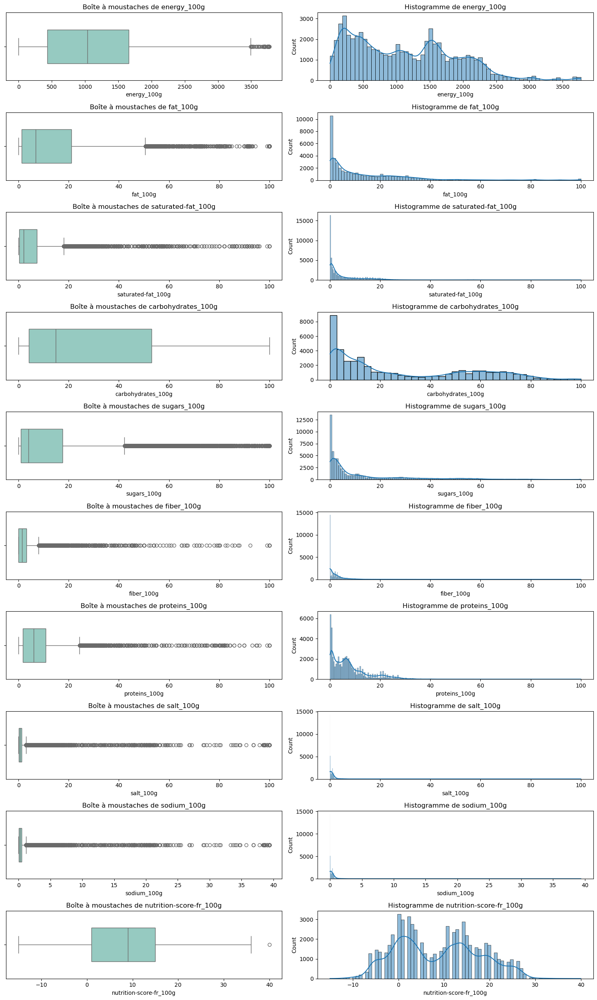

In [36]:
indicateurs = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

fig, axes = plt.subplots(nrows=len(indicateurs), ncols=2, figsize=(15, 25))

for i, indicateur in enumerate(indicateurs):
    sns.boxplot(food_france[indicateur], width=0.5, orient='h', palette='Set3', ax=axes[i, 0])
    axes[i, 0].set_title(f'Boîte à moustaches de {indicateur}', fontsize=12)
    
    sns.histplot(food_france[indicateur], kde=True, palette='Set3', ax=axes[i, 1])
    axes[i, 1].set_title(f'Histogramme de {indicateur}', fontsize=12)

plt.tight_layout()
plt.show()


## Valeurs manquantes


Test de differantes methodes d'imputations pour les variables quantitatives

Afin d'évaluer et sélectionner le meilleur modèle pour effectuer l'imputation de nos valeurs manquantes, nous utiliserons l'erreur quadratique moyenne (RMSE).

Le RMSE, ou erreur quadratique moyenne (Root Mean Squared Error), représente une mesure fréquemment employée pour évaluer la précision des modèles.

Il évalue la moyenne des erreurs au carré, mesurant ainsi la disparité entre les valeurs prédites par le modèle et les valeurs réelles.

La formule pour calculer le RMSE est la suivante:

RMSE = sqrt((1/n) * Σ(actual - prediction)²)

sqrt : est la fonction racine carrée

n : est le nombre total d'observations

actual : est la valeur réelle de l'observation

prediction : est la valeur prédite par le modèle pour cette observation

### Imputation metier 

In [37]:
# Appliquation de  la fonction aux lignes avec des valeurs manquantes dans 'nutrition_grade_fr'(impuation de'nutrition_grade_fr en fonction de 'nutrition-score-fr_100g')  )
food_france['nutrition_grade_fr'].fillna(food_france['nutrition-score-fr_100g'].apply(determine_grade), inplace=True)
food_france.isnull().sum()

energy_100g                   11
fat_100g                   17055
saturated-fat_100g           106
carbohydrates_100g         17106
sugars_100g                   69
fiber_100g                 16549
proteins_100g                 40
salt_100g                      0
sodium_100g                    1
nutrition-score-fr_100g      568
product_name                 340
nutrition_grade_fr           568
dtype: int64

Les valeurs manquantes de la variable 'fibre_100g' sont imputées par 0 en supposant que l'absence de données indique que ces aliments ne contiennent pas de fibres

In [38]:
food_france['fiber_100g'].fillna(0, inplace=True)

In [39]:
#Nom du produit product_name
#Il manque de valeurs dans product_name il est possible de remplacer cette valeur par celle contenue dans generic_name5. 
food_france["product_name"] = food["product_name"].fillna(food["generic_name"])

In [40]:
# on Supprimer les lignes avec des NaN dans la colonne "product_name"
food_france = food_france.dropna(subset=['product_name'])
#on supprime les doublons 
food_france.drop_duplicates(subset='product_name', inplace=True)

In [41]:
food_france.isnull().sum()

energy_100g                    8
fat_100g                   14864
saturated-fat_100g            83
carbohydrates_100g         14899
sugars_100g                   61
fiber_100g                     0
proteins_100g                 32
salt_100g                      0
sodium_100g                    1
nutrition-score-fr_100g      479
product_name                   0
nutrition_grade_fr           479
dtype: int64

In [42]:
food_france['product_name'].duplicated().sum()

0

### Comparatifs des de l'imputation par KNN par rapport a IterativeImputer sur nos variables quantitatives :

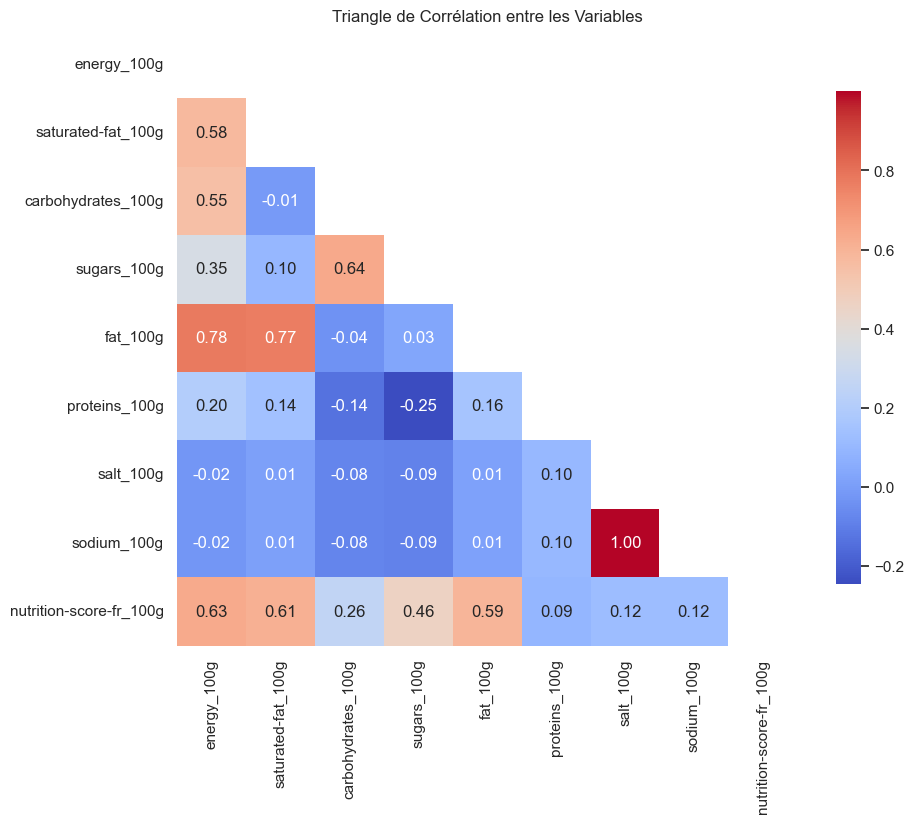

In [43]:
# Sélection les variables quantative :
variables = ['energy_100g','saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fat_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']
subset_df = food_france[variables]

# Calcule de la matrice de corrélation
correlation_matrix = subset_df.corr()

# masque pour la moitié supérieure du triangle de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Configuration du le style du tracé
sns.set(style="white")

# figure matplotlib
fig, ax = plt.subplots(figsize=(10, 8))

#le triangle de corrélation avec un dégradé de couleurs
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', mask=mask, cbar_kws={"shrink": 0.8})

#  détails au graphique
plt.title("Triangle de Corrélation entre les Variables")
plt.show()


In [47]:
# Sélection d'un sous-ensemble de 7% des données
data_subset = food_france.sample(frac=0.07, random_state=42)
# Variables avant imputation
before_imputation = data_subset[variables]



# Création d'un DataFrame pour stocker les résultats
results = pd.DataFrame(columns=['Variable', 'Méthode', 'Erreur', 'Pourcentage d\'erreur'])

# Calcul de l'erreur de prédiction pour chaque méthode d'imputation
for target in variables:
    # Sélectionner les autres variables comme variables explicatives
    features = [col for col in variables if col != target]

    for method in ['KNN', 'IterativeImputer']:
        if method == 'KNN':
            imputer = KNNImputer(n_neighbors=3)
        elif method == 'IterativeImputer':
            imputer = IterativeImputer(estimator=LinearRegression())
        
        # Suppression des lignes avec des valeurs manquantes dans la colonne cible
        data_target = data_subset.dropna(subset=[target])
        
        # Séparation en ensemble d'entraînement et de test pour le sous-ensemble
        train_target, test_target = train_test_split(data_target, test_size=0.2, random_state=42)
        
        # Imputer les valeurs manquantes pour le sous-ensemble d'entraînement
        train_imputed = imputer.fit_transform(train_target[features])

        # Normalisation des données d'entraînement
        scaler = StandardScaler()
        train_imputed_scaled = scaler.fit_transform(train_imputed)
        
        # Imputer les valeurs manquantes pour le sous-ensemble de test
        test_imputed = imputer.transform(test_target[features])

        # Normalisation des données de test en utilisant le scaler de l'entraînement
        test_imputed_scaled = scaler.transform(test_imputed)
        
        # Calcul de l'erreur de prédiction
        error = mean_squared_error(test_target[target], test_imputed_scaled[:, 0])
        
        # Calcul de l'erreur en pourcentage
        range_target = test_target[target].max() - test_target[target].min()
        percent_error = error / range_target * 100
        
        # Ajout des résultats au DataFrame
        results = results.append({'Variable': target, 'Méthode': method, 'Erreur': error, 'Pourcentage d\'erreur': percent_error}, ignore_index=True)

# Afficher les résultats
results


,Variable,Méthode,Erreur,Pourcentage d'erreur
0,energy_100g,KNN,1.885703e+06,50071.781807
1,energy_100g,IterativeImputer,1.885706e+06,50071.864917
2,saturated-fat_100g,KNN,1.233848e+02,129.878748
3,saturated-fat_100g,IterativeImputer,1.233849e+02,129.878889
4,carbohydrates_100g,KNN,1.363897e+03,1410.441478
5,carbohydrates_100g,IterativeImputer,1.363894e+03,1410.438701
6,sugars_100g,KNN,4.655663e+02,465.566266
7,sugars_100g,IterativeImputer,4.655639e+02,465.563943
8,fat_100g,KNN,3.840298e+02,417.423675
9,fat_100g,IterativeImputer,3.840294e+02,417.423245


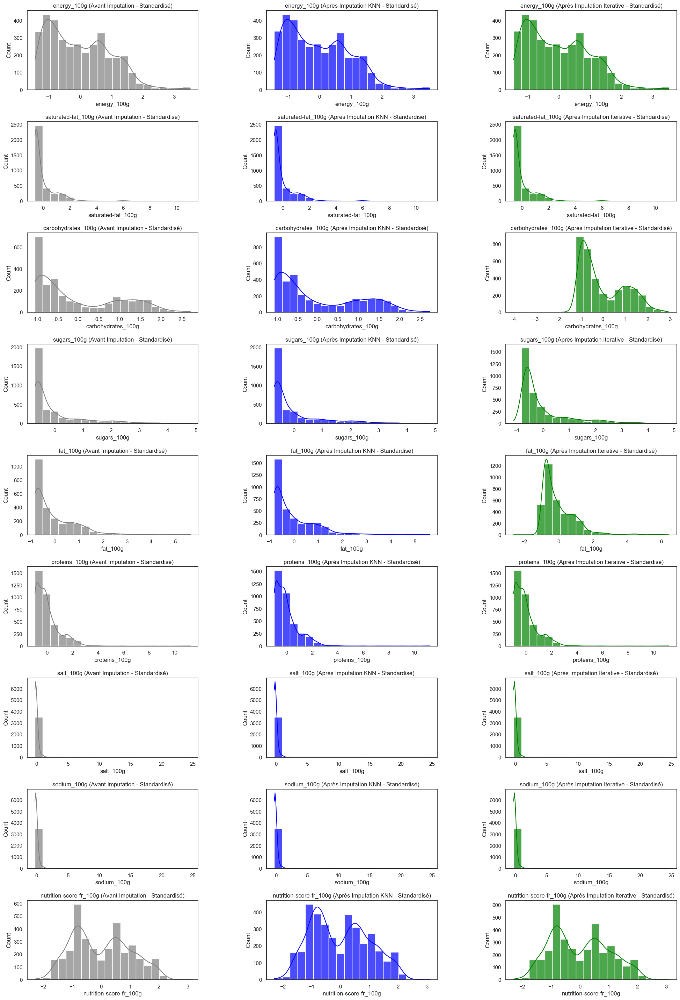

In [48]:
# Standardisation des variables avant imputation
scaler_before_imputation = StandardScaler()
before_imputation_standardized = pd.DataFrame(scaler_before_imputation.fit_transform(before_imputation), columns=variables)

# Imputation avec KNN
imputer_knn = KNNImputer(n_neighbors=3)
after_imputation_knn = pd.DataFrame(imputer_knn.fit_transform(data_subset[variables]), columns=variables)

# Imputation avec IterativeImputer
imputer_iterative = IterativeImputer(estimator=LinearRegression())
after_imputation_iterative = pd.DataFrame(imputer_iterative.fit_transform(data_subset[variables]), columns=variables)

# Standardisation des variables après imputation avec KNN
scaler_after_imputation_knn = StandardScaler()
after_imputation_knn_standardized = pd.DataFrame(scaler_after_imputation_knn.fit_transform(after_imputation_knn), columns=variables)

# Standardisation des variables après imputation avec IterativeImputer
scaler_after_imputation_iterative = StandardScaler()
after_imputation_iterative_standardized = pd.DataFrame(scaler_after_imputation_iterative.fit_transform(after_imputation_iterative), columns=variables)

# Histogrammes comparatifs
fig, axes = plt.subplots(nrows=len(variables), ncols=3, figsize=(24, 4 * len(variables)))

for i, var in enumerate(variables):
    # Histogramme avant imputation
    sns.histplot(before_imputation_standardized[var], bins=20, color='gray', alpha=0.7, kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'{var} (Avant Imputation - Standardisé)', fontsize=12)

    # Histogramme après imputation avec KNN
    sns.histplot(after_imputation_knn_standardized[var], bins=20, color='blue', alpha=0.7, kde=True, ax=axes[i, 1])
    axes[i, 1].set_title(f'{var} (Après Imputation KNN - Standardisé)', fontsize=12)

    # Histogramme après imputation avec IterativeImputer
    sns.histplot(after_imputation_iterative_standardized[var], bins=20, color='green', alpha=0.7, kde=True, ax=axes[i, 2])
    axes[i, 2].set_title(f'{var} (Après Imputation Iterative - Standardisé)', fontsize=12)

# Ajuster les espacements entre les sous-graphiques
plt.subplots_adjust(wspace=0.4, hspace=0.4)

plt.show()


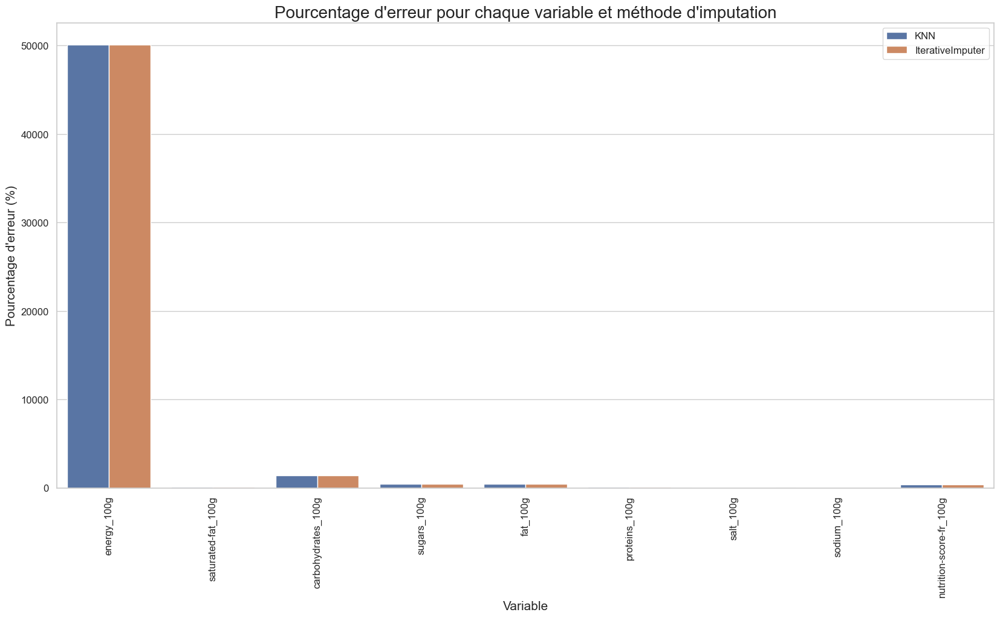

In [49]:
plt.figure(figsize=(20, 10))
sns.set_style("whitegrid") 
sns.barplot(x='Variable', y='Pourcentage d\'erreur', hue='Méthode', data=results)
plt.title('Pourcentage d\'erreur pour chaque variable et méthode d\'imputation', fontsize=20) 
plt.xlabel('Variable', fontsize=15) 
plt.ylabel('Pourcentage d\'erreur (%)', fontsize=15) 
plt.xticks(rotation=90, fontsize=12) 
plt.yticks(fontsize=12) 
plt.legend(fontsize=12) 
plt.show()

In [50]:
# Création un dictionnaire pour stocker la meilleure méthode pour chaque variable
meilleur_imputer= {}

# Pour chaque variable, trouver la méthode avec le taux d'erreur le plus faible
for variable in variables:
    # Filtrer les résultats pour cette variable
    variable_results = results[results['Variable'] == variable]
    
    # Trouver l'index de la ligne avec le taux d'erreur le plus faible
    meilleur_imputer_index = variable_results['Erreur'].idxmin()
    
    # Ajouter la méthode correspondante au dictionnaire
    meilleur_imputer[variable] = variable_results.loc[meilleur_imputer_index, 'Méthode']

# Afficher le dictionnaire
print(meilleur_imputer)

{'energy_100g': 'KNN', 'saturated-fat_100g': 'KNN', 'carbohydrates_100g': 'IterativeImputer', 'sugars_100g': 'IterativeImputer', 'fat_100g': 'IterativeImputer', 'proteins_100g': 'IterativeImputer', 'salt_100g': 'IterativeImputer', 'sodium_100g': 'IterativeImputer', 'nutrition-score-fr_100g': 'KNN'}


In [51]:
# Création d'une liste vide pour stocker les variables à imputer avec KNN
knn_variables = []
IterativeImputer_variables = []

# Parcourir le dictionnaire best_method
for variable, method in meilleur_imputer.items():
    # Si la méthode est KNN, ajouter la variable à la liste knn_variables
    if method == 'KNN':
        knn_variables.append(variable)
    elif method == 'IterativeImputer':
        IterativeImputer_variables.append(variable)

print('KNN variables: ', knn_variables)
print('IterativeImputer variables: ', IterativeImputer_variables)

KNN variables:  ['energy_100g', 'saturated-fat_100g', 'nutrition-score-fr_100g']
IterativeImputer variables:  ['carbohydrates_100g', 'sugars_100g', 'fat_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']


In [52]:
food_france.isnull().sum()

energy_100g                    8
fat_100g                   14864
saturated-fat_100g            83
carbohydrates_100g         14899
sugars_100g                   61
fiber_100g                     0
proteins_100g                 32
salt_100g                      0
sodium_100g                    1
nutrition-score-fr_100g      479
product_name                   0
nutrition_grade_fr           479
dtype: int64

#### Imputation KNN


Nous avons décidé d'imputer les données avec la méthode KNN afin de préserver la distribution originale de nos variables.

In [53]:

# Variables catégorielles
categorical_variables = ['nutrition_grade_fr','product_name']

# Instanciation du StandardScaler
scaler = StandardScaler()

# Standardisation des colonnes numériques avant imputation
food_france[variables] = scaler.fit_transform(food_france[variables])

# Imputation avec KNN sur les données standardisées
imputer = KNNImputer(n_neighbors=3)
food_france[variables] = imputer.fit_transform(food_france[variables])



In [54]:
# Appliquation de  la fonction aux lignes avec des valeurs manquantes dans 'nutrition_grade_fr'(impuation de'nutrition_grade_fr en fonction de 'nutrition-score-fr_100g')  )
food_france['nutrition_grade_fr'].fillna(food_france['nutrition-score-fr_100g'].apply(determine_grade), inplace=True)


In [55]:
food_france.isnull().mean()

energy_100g                0.0
fat_100g                   0.0
saturated-fat_100g         0.0
carbohydrates_100g         0.0
sugars_100g                0.0
fiber_100g                 0.0
proteins_100g              0.0
salt_100g                  0.0
sodium_100g                0.0
nutrition-score-fr_100g    0.0
product_name               0.0
nutrition_grade_fr         0.0
dtype: float64

# Controle apres imputation 

In [56]:
remove_incoherence(food_france, 'sugars_100g', 'carbohydrates_100g')
remove_incoherence(food_france, 'saturated-fat_100g', 'fat_100g')

In [57]:
food_france.shape

(7265, 12)

In [58]:
food_france.to_csv(r'C:\Users\imane\Downloads\data_science\projet3\food_france.csv' , index=False)

# Analyse univariée

In [59]:
food_france.describe(include='all')

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,product_name,nutrition_grade_fr
count,7265.000000,7265.000000,7265.000000,7265.000000,7265.000000,7265.000000,7265.000000,7265.000000,7265.000000,7265.000000,7265,7265
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7265,7
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Madeleines nature,d
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2459
mean,0.528849,0.179031,-0.279676,0.587718,-0.247191,3.503339,0.134049,0.063596,0.063590,-0.108310,NaN,NaN
std,0.718091,0.651770,0.362058,0.714709,0.543838,4.692956,0.679760,0.841424,0.841417,0.817491,NaN,NaN
min,-1.464876,-0.648841,-0.648967,-0.716425,-0.718457,0.000000,-0.993487,-0.276542,-0.276546,-2.305240,NaN,NaN
25%,-0.110246,-0.335277,-0.529847,-0.147182,-0.628299,0.000000,-0.225553,-0.135580,-0.135584,-0.859182,NaN,NaN
50%,0.661195,0.004803,-0.374992,0.795015,-0.516927,2.500000,0.004828,-0.031073,-0.031078,-0.080536,NaN,NaN
75%,1.114186,0.548595,-0.184400,1.199864,0.034628,5.000000,0.388795,0.087676,0.087670,0.475640,NaN,NaN


## variables quantitatives

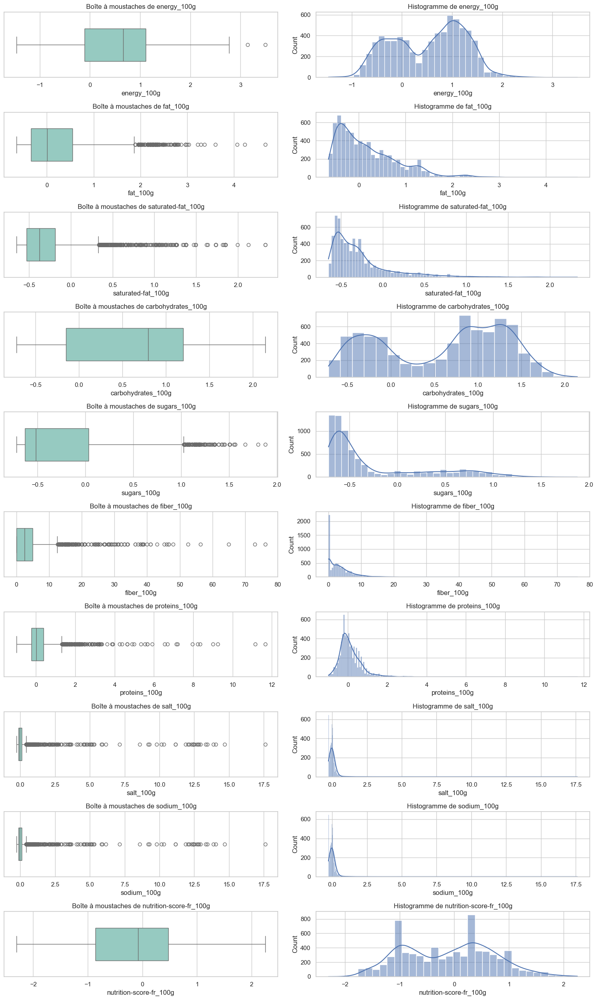

In [60]:
indicateurs = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

fig, axes = plt.subplots(nrows=len(indicateurs), ncols=2, figsize=(15, 25))

for i, indicateur in enumerate(indicateurs):
    sns.boxplot(food_france[indicateur], width=0.5, orient='h', palette='Set3', ax=axes[i, 0])
    axes[i, 0].set_title(f'Boîte à moustaches de {indicateur}', fontsize=12)
    
    sns.histplot(food_france[indicateur], kde=True, palette='Set3', ax=axes[i, 1])
    axes[i, 1].set_title(f'Histogramme de {indicateur}', fontsize=12)

plt.tight_layout()
plt.show()

La distribution de la teneur en nutriments des aliments est généralement asymétrique, avec une queue longue à droite. Cela signifie que la plupart des aliments ont une teneur en nutriments modérée, mais qu'il existe une petite quantité d'aliments qui ont une teneur en nutriments beaucoup plus élevée ou plus faible. Il existe une grande variabilité dans les données, avec des valeurs extrêmes allant de très faibles à très élevées

# variables qualitatives

In [74]:
food_france['nutrition_grade_fr'] = food_france['nutrition_grade_fr'].str.upper()

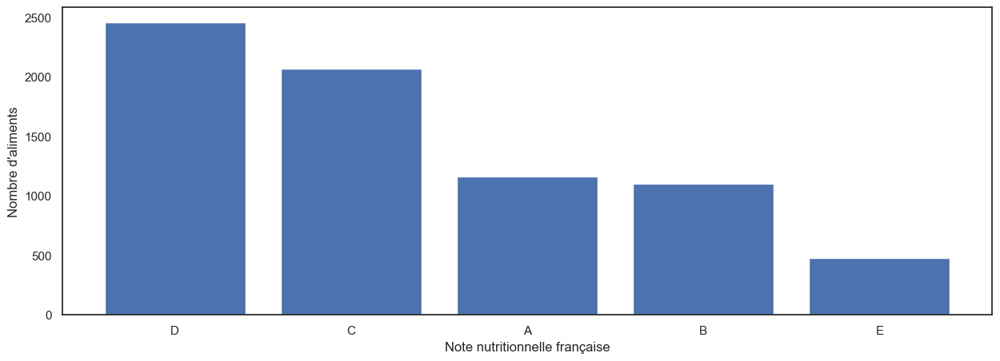

In [75]:
# barplot pour `nutrition_grade_fr`
plt.figure(figsize=(15, 5))
plt.bar(food_france["nutrition_grade_fr"].value_counts().index, food_france["nutrition_grade_fr"].value_counts())
plt.xlabel("Note nutritionnelle française")
plt.ylabel("Nombre d'aliments")

plt.show()


# Analyse bivarièe

# variables quantitatives

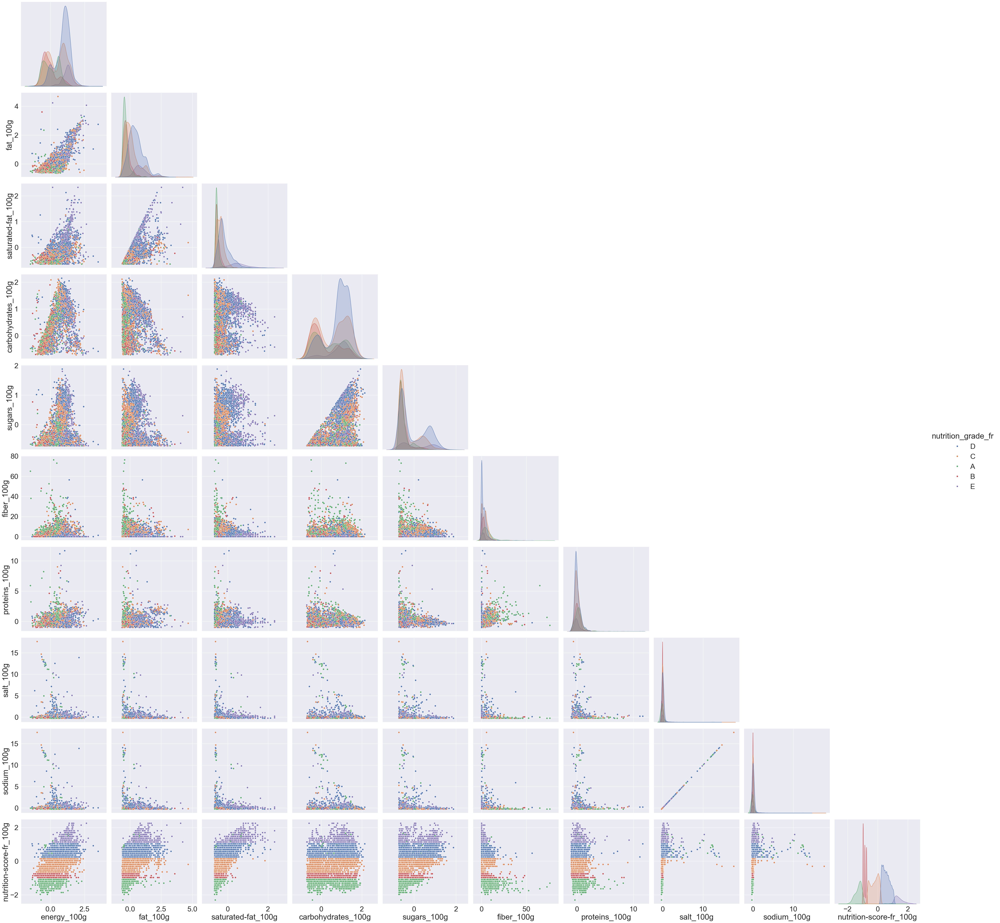

In [76]:
# Définir la taille de la police
sns.set(font_scale=2.5)

# Créer le pairplot
g = sns.pairplot(food_france, hue='nutrition_grade_fr', corner=True, height=5)

# Afficher le pairplot
plt.show()

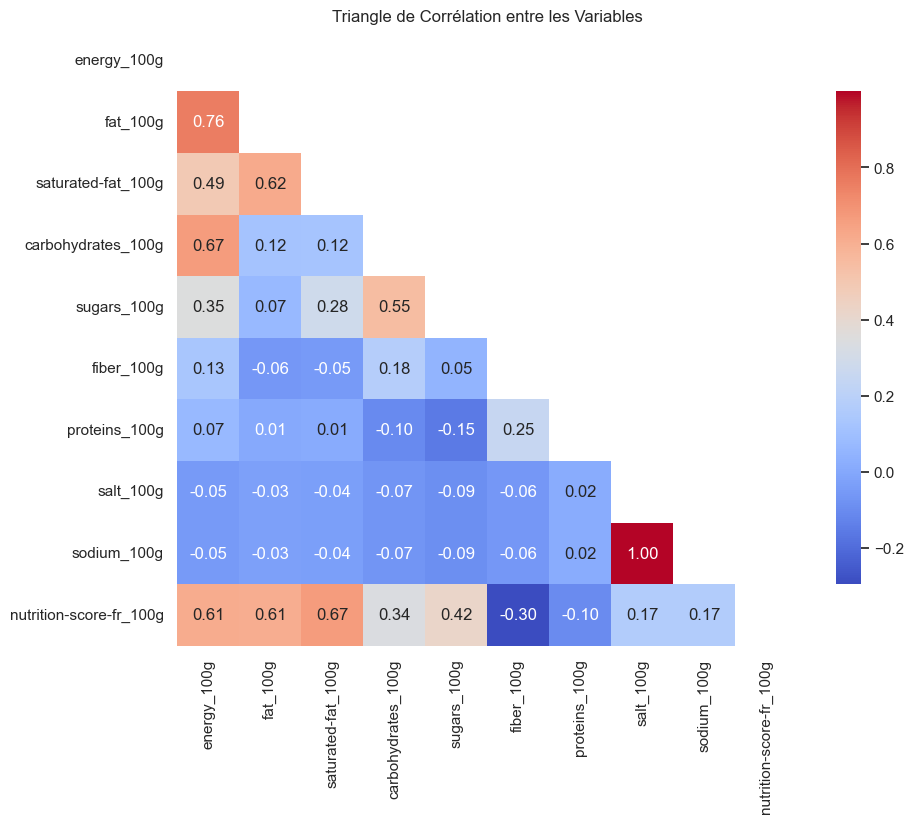

In [77]:
# Sélection les variables quantative :
variables = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']
subset_df = food_france[variables]

# Calcule de la matrice de corrélation
correlation_matrix = subset_df.corr()

# masque pour la moitié supérieure du triangle de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Configuration du le style du tracé
sns.set(style="white")

# figure matplotlib
fig, ax = plt.subplots(figsize=(10, 8))

#le triangle de corrélation avec un dégradé de couleurs
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', mask=mask, cbar_kws={"shrink": 0.8})

#  détails au graphique
plt.title("Triangle de Corrélation entre les Variables")
plt.show()


les variables suivantes sont positivement corrélées : Energie_100g et Carbohydrates_100g Energie_100g et Sugars_100g Carbohydrates_100g et Sugars_100g

les variables suivantes sont négativement corrélées :

Energie_100g et Saturated-fat_100g Energie_100g et Fiber_100g Energie_100g et Proteins_100g Carbohydrates_100g et Saturated-fat_100g Carbohydrates_100g et Fiber_100g Carbohydrates_100g et Proteins_100g

Nutrition-score-fr_100g est positivement corrélé avec les variables suivantes :

Energy_100g Carbohydrates_100g Sugars_100g Fiber_100g

## variables quantitatives/qualitatives

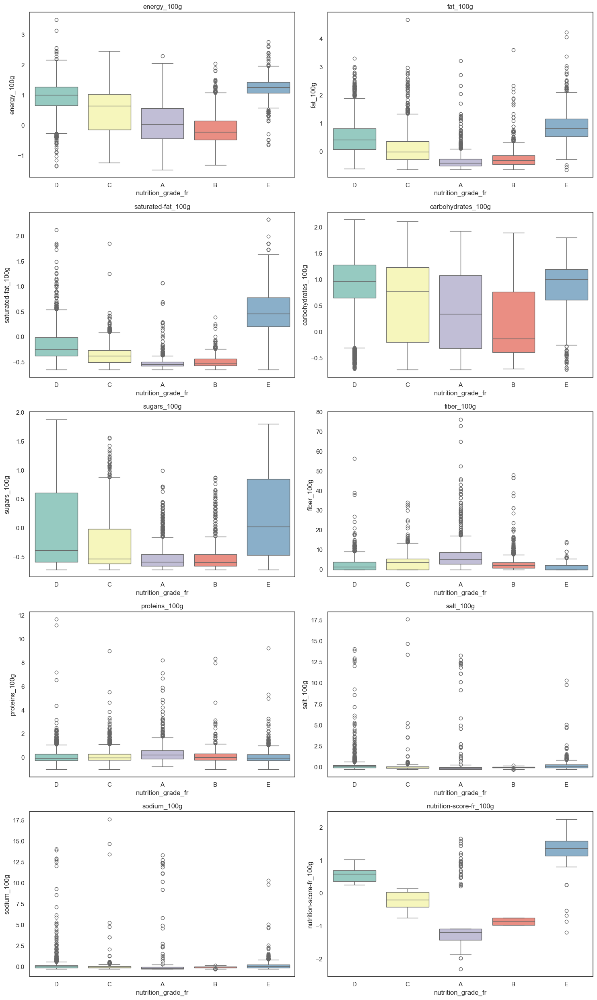

In [78]:
variables = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']
data_for_boxplots = {variable: food_france[variable] for variable in variables}

# Calculer le nombre de lignes nécessaire pour avoir deux boxplots par ligne
num_rows = (len(variables) + 1) // 2

# palette de couleurs
color_palette = sns.color_palette("Set3")

# les sous-graphiques
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, num_rows * 5))

axes = axes.flatten()

# Itérer sur chaque variable et créer un boxplot avec une couleur différente
for i, (variable, data_for_boxplot) in enumerate(data_for_boxplots.items()):
    sns.boxplot(x="nutrition_grade_fr", y=variable, data=food_france, ax=axes[i], palette=color_palette)
    axes[i].set_title(variable)

# Masquer les sous-graphiques vides restants
for j in range(len(variables), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()



la majorité des aliments ont un grade nutritionnel D ou E. Seuls une petite proportion des aliments ont un grade nutritionnel A ou B.

Le graphique montre également que les aliments avec un grade nutritionnel D ou E sont plus susceptibles d'être riches en énergie, en sucres, en graisses saturées et en sel. Les aliments avec un grade nutritionnel A ou B sont plus susceptibles d'être riches en fibres, en protéines et en nutriments essentiels

# Analyse multivariée

## ACP (Analyse en composantes principale)

In [79]:
#nous avons vu sur le triangle de corrélation que les variables qui sont fortement corrélées 
#variables_X = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'nutrition_grade_fr','nutrition-score-fr_100g']
X = food_france

In [80]:
X.shape

(7265, 12)

In [81]:
# Appliquez StandardScaler aux colonnes numériques uniquement
variables2 = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'nutrition-score-fr_100g']

X_scaled = (X[variables2])

In [82]:
# Nombre de composantes souhaitées
n_comp = 8

# Calcul des composantes principales
pca = PCA(n_components=n_comp)
pca.fit(X_scaled)

PCA(n_components=8)

In [83]:
# Proportion de variance expliquée
pca.explained_variance_ratio_


array([0.8770394 , 0.05302355, 0.02879353, 0.01823616, 0.01176754,
       0.00618681, 0.00325428, 0.00169873])

In [84]:
# Cumul de variance expliquée
pca.explained_variance_ratio_.cumsum()

array([0.8770394 , 0.93006295, 0.95885648, 0.97709264, 0.98886018,
       0.99504699, 0.99830127, 1.        ])

In [85]:
#pca = PCA(n_components=8)
#X_pca = pca.fit_transform(X[variables2])

# Créer un DataFrame à partir des composantes principales
num_pc = pca.n_features_
pc_list = ["F"+str(i) for i in range(1, num_pc+1)]
df_f = pd.DataFrame(pca.components_, columns=pc_list)

# Ajouter le nom des variables en tant qu'index
df_f.index =  variables2

# Afficher le DataFrame
df_f


,F1,F2,F3,F4,F5,F6,F7,F8
energy_100g,0.019817,-0.008930,-0.004380,0.004981,0.997612,0.036934,-0.011056,-0.052612
fat_100g,0.554002,0.469215,0.223520,0.207258,0.026196,-0.004233,0.045839,0.614163
saturated-fat_100g,-0.099484,-0.076655,-0.029780,-0.087107,0.016201,0.062630,0.978925,0.115213
sugars_100g,0.108971,0.174725,0.013843,-0.336478,-0.038978,0.909824,-0.049184,-0.111670
fiber_100g,-0.138412,-0.511463,0.023778,0.690135,-0.005772,0.401157,-0.050607,0.280845
proteins_100g,-0.625872,0.006503,0.364524,-0.368867,0.044044,-0.005708,-0.151192,0.560776
salt_100g,-0.382873,0.550254,0.429324,0.448853,-0.009361,0.056839,0.099525,-0.389380
nutrition-score-fr_100g,-0.336827,0.423008,-0.794468,0.149651,0.015561,0.052213,-0.041697,0.222105


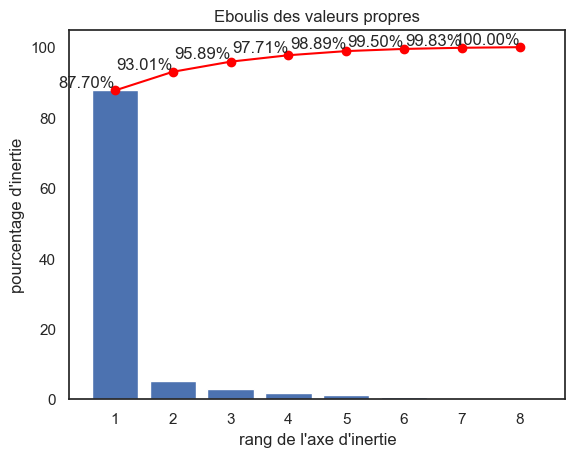

In [86]:
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_ * 100
    plt.bar(np.arange(len(scree)) + 1, scree)
    plt.plot(np.arange(len(scree)) + 1, scree.cumsum(), c="red", marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")

    # Ajouter des étiquettes pour chaque point de la barre
    #for i, percentage in enumerate(scree):
        #plt.text(i + 1, percentage, f"{percentage:.2f}%", ha="center", va="bottom")

    # Ajouter des étiquettes pour chaque point de la courbe
    for i, percentage_cumsum in enumerate(scree.cumsum()):
        plt.text(i + 1, percentage_cumsum, f"{percentage_cumsum:.2f}%", ha="right", va="bottom")

    plt.show()

display_scree_plot(pca)

On va choisir 4 composantes principales, car les 4 premières dimensions représentent 97.71% des informations importantes

## Cercles des corrélations

In [87]:
# Calcul des composantes principales
n_comp = 4
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

PCA(n_components=4)

In [88]:
# Définition de la fonction pour le graphique Cercle de corrélation
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:  # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(10, 10))

            # détermination des limites du graphique
            if lims is not None:
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin, xmax, ymin, ymax = min(pcs[d1, :]), max(
                    pcs[d1, :]), min(pcs[d2, :]), max(pcs[d2, :])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles='xy', scale_units='xy', scale=1, color="grey")
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(
                    lines, axes=ax, alpha=.1, color='black'))

            # affichage des noms des variables
            if labels is not None:
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14', ha='center',
                                 va='center', rotation=label_rotation, color="blue", alpha=0.5)

            # affichage du cercle
            circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(
                d1+1, round(100*pca.explained_variance_ratio_[d1], 1)))
            plt.ylabel('F{} ({}%)'.format(
                d2+1, round(100*pca.explained_variance_ratio_[d2], 1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

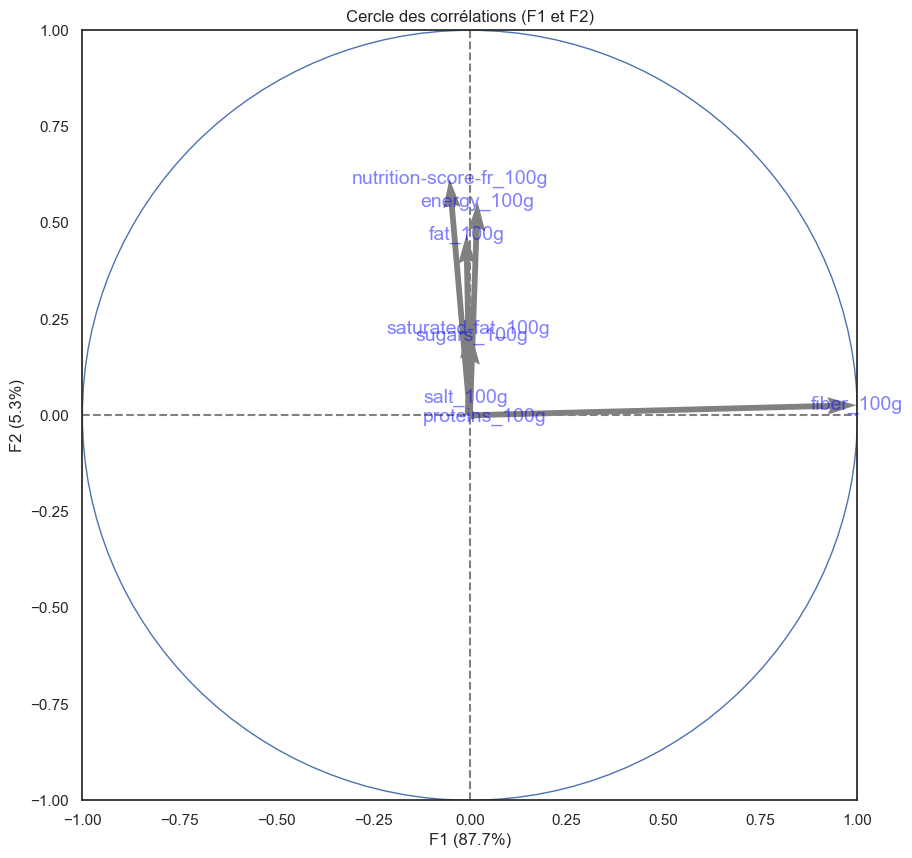

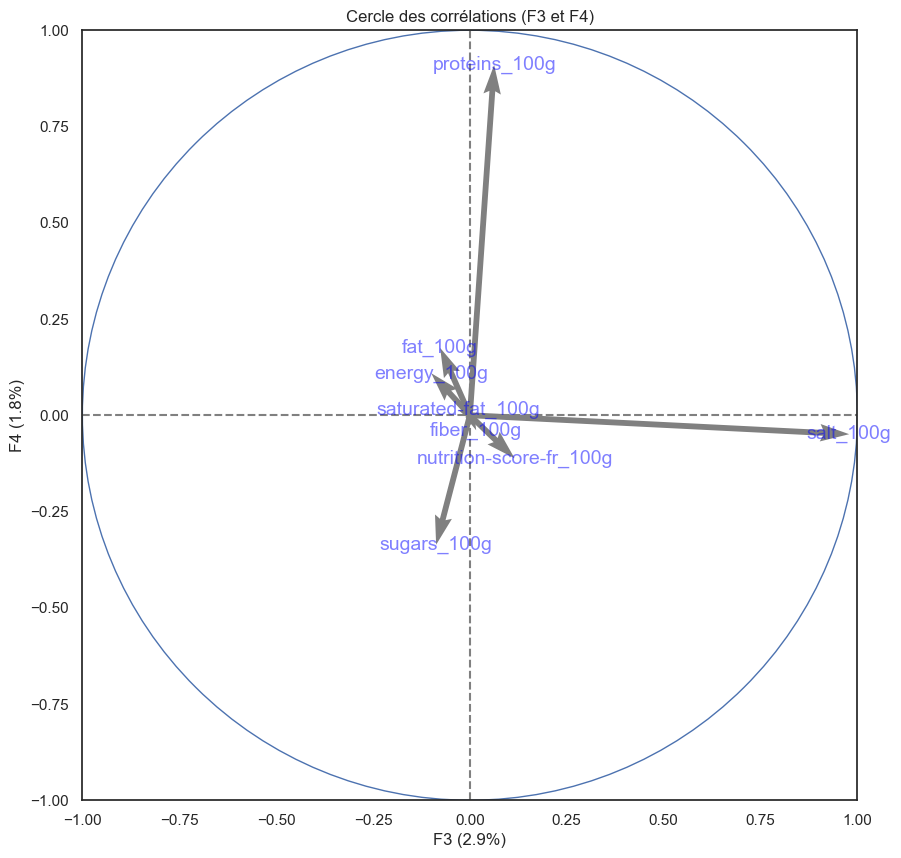

In [89]:
# Générer le Cercle des corrélations (F1 et F2) (F3 et F4).
pcs = pca.components_ 
display_circles(pcs, pca.n_features_, pca, [(0,1),(2,3)], labels=np.array(variables2))

F1 :

Energy_100g : Contribution positive à F1. Les produits énergétiques élevés contribuent positivement à F1.
Fat_100g : Contribution positive à F1. Les produits riches en matières grasses contribuent positivement à F1.
Saturated-fat_100g : Contribution positive à F1. Les produits riches en graisses saturées contribuent positivement à F1.
Sugars_100g : Contribution positive à F1. Les produits riches en sucres contribuent positivement à F1.
Fiber_100g : Contribution positive à F1. Les produits riches en fibres contribuent positivement à F1.
Proteins_100g : Contribution négative à F1. Les produits riches en protéines contribuent négativement à F1.
Salt_100g : Contribution négative à F1. Les produits riches en sel contribuent négativement à F1.
Nutrition-score-fr_100g : Contribution négative à F1. Les produits avec un score nutritionnel élevé contribuent négativement à F1.
 F2 :

Energy_100g : Contribution positive à F2. Les produits énergétiques élevés contribuent positivement à F2.
Fat_100g : Contribution positive à F2. Les produits riches en matières grasses contribuent positivement à F2.
Saturated-fat_100g : Contribution négative à F2. Les produits riches en graisses saturées contribuent négativement à F2.
Sugars_100g : Contribution négative à F2. Les produits riches en sucres contribuent négativement à F2.
Fiber_100g : Contribution positive à F2. Les produits riches en fibres contribuent positivement à F2.
Proteins_100g : Contribution négative à F2. Les produits riches en protéines contribuent négativement à F2.
Salt_100g : Contribution positive à F2. Les produits riches en sel contribuent positivement à F2.
F3 :

Energy_100g : Contribution positive à F3. Les produits énergétiques élevés contribuent positivement à F3.
Fat_100g : Contribution positive à F3. Les produits riches en matières grasses contribuent positivement à F3.
Saturated-fat_100g : Contribution négative à F3. Les produits riches en graisses saturées contribuent négativement à F3.
Sugars_100g : Contribution négative à F3. Les produits riches en sucres contribuent négativement à F3.
Fiber_100g : Contribution positive à F3. Les produits riches en fibres contribuent positivement à F3.
Proteins_100g : Contribution positive à F3. Les produits riches en protéines contribuent positivement à F3.
Salt_100g : Contribution négative à F3. Les produits riches en sel contribuent négativement à F3.
F4 :

Energy_100g : Contribution positive à F4. Les produits énergétiques élevés contribuent positivement à F4.
Fat_100g : Contribution négative à F4. Les produits riches en matières grasses contribuent négativement à F4.
Saturated-fat_100g : Contribution positive à F4. Les produits riches en graisses saturées contribuent positivement à F4.
Sugars_100g : Contribution positive à F4. Les produits riches en sucres contribuent positivement à F4.
Fiber_100g : Contribution négative à F4. Les produits riches en fibres contribuent négativement à F4.
Proteins_100g : Contribution négative à F4. Les produits riches en protéines contribuent négativement à F4.
Salt_100g : Contribution négative à F4. Les produits riches en sel contribuent négativement à F4.

En résumé, chaque composante principale semble refléter un certain profil nutritionnel. F1 met l'accent sur les produits moins sains, F2 sur les produits équilibrés, F3 sur les produits riches mais équilibrés, et F4 sur les produits riches mais moins équilibrés sur le plan nutritionnel. Les scores nutritionnels élevés contribuent négativement à plusieurs composantes, suggérant une relation avec la qualité nutritionnelle globale.

## Projection

In [90]:
# Fonction qui permet de projeter les individus sur les dimensions 
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(9,9))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

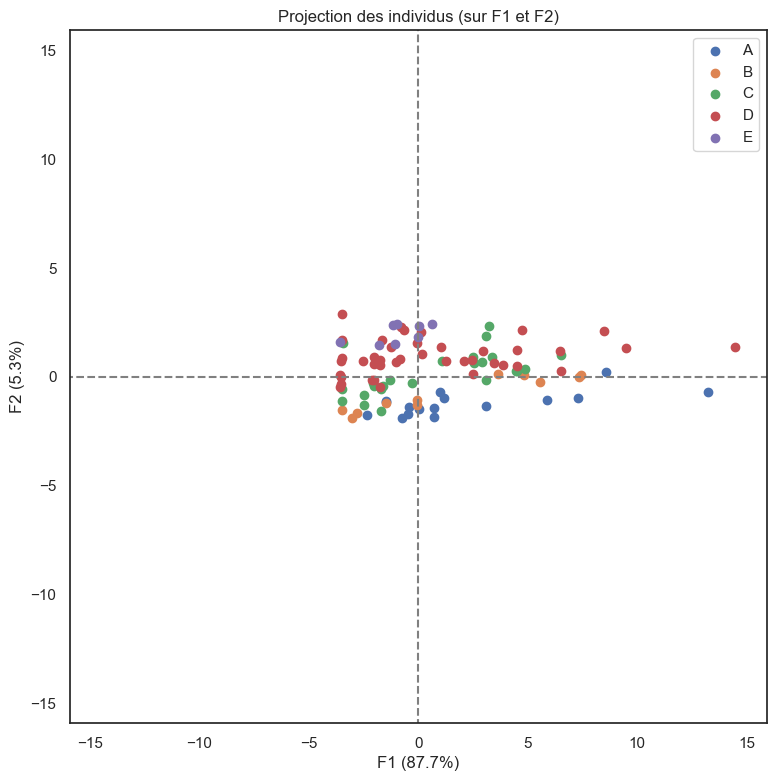

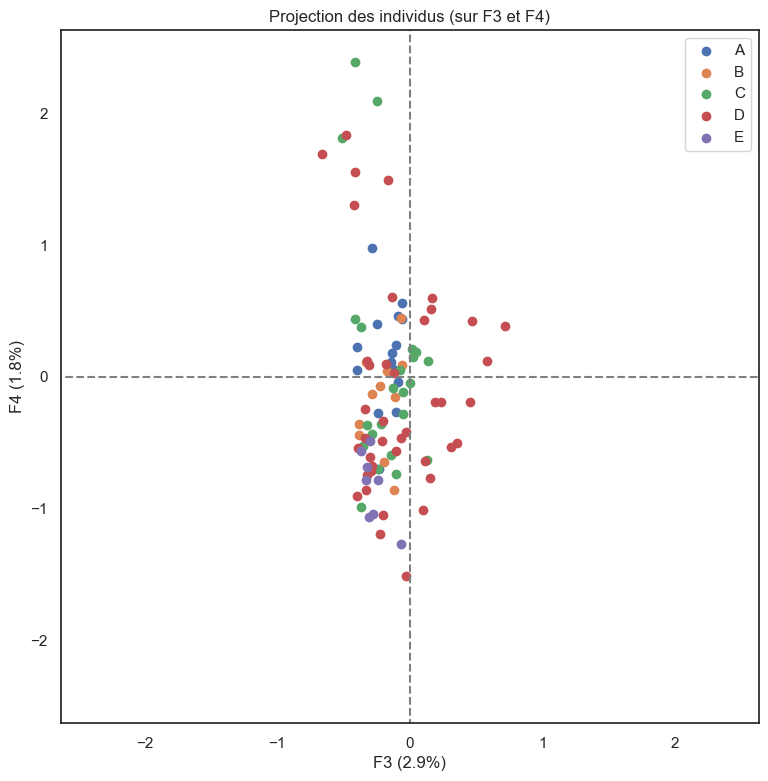

In [91]:
# Supposons que vous voulez afficher uniquement les 100 premières lignes
subset_size = 100
X_subset = X_scaled[:subset_size]

# Appliquer la transformation PCA sur le sous-ensemble de données
X_projected_subset = pca.transform(X_subset)

# Afficher les plans factoriels pour les composantes (0, 1) et (2, 3)
display_factorial_planes(X_projected_subset, n_comp, pca, [(0, 1), (2, 3)],  illustrative_var=X.nutrition_grade_fr[:subset_size])

plt.show()

# Analyse statistique

## test de normalité

In [92]:
# Variables numériques
numeric_indicators = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

# Boucle pour tester la normalité de chaque variable
for var in numeric_indicators:
    # Exclure les valeurs manquantes
    data = food_france[var].dropna()
    
    # Test de normalité de Shapiro-Wilk
    stat, p_value = shapiro(data)
    
    # Affichage des résultats
    print(f"Variable: {var}")
    print(f"Statistique de test: {stat:.4f}")
    print(f"P-value: {p_value:.4f}")
    
    # Interprétation du test
    alpha = 0.05
    if p_value > alpha:
        print("La variable suit une distribution normale (on ne peut pas rejeter l'hypothèse nulle)")
    else:
        print("La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)")
    
    print("\n" + "="*50 + "\n")


Variable: energy_100g
Statistique de test: 0.9634
P-value: 0.0000
La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)


Variable: fat_100g
Statistique de test: 0.8945
P-value: 0.0000
La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)


Variable: saturated-fat_100g
Statistique de test: 0.7824
P-value: 0.0000
La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)


Variable: carbohydrates_100g
Statistique de test: 0.9219
P-value: 0.0000
La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)


Variable: sugars_100g
Statistique de test: 0.7742
P-value: 0.0000
La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)


Variable: fiber_100g
Statistique de test: 0.6648
P-value: 0.0000
La variable ne suit pas une distribution normale (on rejette l'hypothèse nulle)


Variable: proteins_100g
Statistique de test: 0.7322
P-value: 0.0000
La variable ne suit pas une distri

## teste statisque entre variables quantitatives

In [93]:
# Sélectionnez uniquement les variables numériques
numeric_indicators = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']
subset_data = food_france[numeric_indicators]

# Variable de référence (energy_100g)
reference_variable = 'energy_100g'

# Seuil de signification
alpha = 0.05

# Boucle pour tester la corrélation entre chaque variable numérique et la variable de référence
correlation_results = {}

for variable in numeric_indicators:
    if variable != reference_variable:
        # Calcul du test de corrélation de Spearman
        correlation_coefficient, p_value = spearmanr(subset_data[reference_variable], subset_data[variable])
        
        # Interprétation
        is_significant = p_value < alpha
        correlation_results[variable] = {'correlation_coefficient': correlation_coefficient, 'p_value': p_value, 'is_significant': is_significant}

# Affichage des résultats
for variable, result in correlation_results.items():
    print(f"Corrélation entre {reference_variable} et {variable}:")
    print(f"   Coefficient de corrélation de Spearman: {result['correlation_coefficient']:.3f}")
    print(f"   P-valeur: {result['p_value']:.4f}")
    print(f"   Corrélation significative: {result['is_significant']}")
    print("\n" + "="*50 + "\n")


Corrélation entre energy_100g et fat_100g:
   Coefficient de corrélation de Spearman: 0.794
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre energy_100g et saturated-fat_100g:
   Coefficient de corrélation de Spearman: 0.573
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre energy_100g et carbohydrates_100g:
   Coefficient de corrélation de Spearman: 0.602
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre energy_100g et sugars_100g:
   Coefficient de corrélation de Spearman: 0.311
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre energy_100g et fiber_100g:
   Coefficient de corrélation de Spearman: 0.190
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre energy_100g et proteins_100g:
   Coefficient de corrélation de Spearman: -0.003
   P-valeur: 0.8115
   Corrélation significative: False


Corrélation entre energy_100g et salt_100g:
   Coefficient de corrélation 

In [94]:
# Sélectionnez uniquement les variables numériques
numeric_indicators = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']
subset_data = food_france[numeric_indicators]

# Variable de référence (energy_100g)
reference_variable = 'nutrition-score-fr_100g'

# Seuil de signification
alpha = 0.05

# Boucle pour tester la corrélation entre chaque variable numérique et la variable de référence
correlation_results = {}

for variable in numeric_indicators:
    if variable != reference_variable:
        # Calcul du test de corrélation de Spearman
        correlation_coefficient, p_value = spearmanr(subset_data[reference_variable], subset_data[variable])
        
        # Interprétation
        is_significant = p_value < alpha
        correlation_results[variable] = {'correlation_coefficient': correlation_coefficient, 'p_value': p_value, 'is_significant': is_significant}

# Affichage des résultats
for variable, result in correlation_results.items():
    print(f"Corrélation entre {reference_variable} et {variable}:")
    print(f"   Coefficient de corrélation de Spearman: {result['correlation_coefficient']:.3f}")
    print(f"   P-valeur: {result['p_value']:.4f}")
    print(f"   Corrélation significative: {result['is_significant']}")
    print("\n" + "="*50 + "\n")

Corrélation entre nutrition-score-fr_100g et energy_100g:
   Coefficient de corrélation de Spearman: 0.625
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre nutrition-score-fr_100g et fat_100g:
   Coefficient de corrélation de Spearman: 0.684
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre nutrition-score-fr_100g et saturated-fat_100g:
   Coefficient de corrélation de Spearman: 0.694
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre nutrition-score-fr_100g et carbohydrates_100g:
   Coefficient de corrélation de Spearman: 0.321
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre nutrition-score-fr_100g et sugars_100g:
   Coefficient de corrélation de Spearman: 0.380
   P-valeur: 0.0000
   Corrélation significative: True


Corrélation entre nutrition-score-fr_100g et fiber_100g:
   Coefficient de corrélation de Spearman: -0.328
   P-valeur: 0.0000
   Corrélation significative: True


Corré

## teste statisque entre variables quantitative/quantitative

In [95]:
numeric = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

categorical_variable = 'nutrition_grade_fr'

# Boucle sur chaque variable continue
for variable in numeric:
    # Créez des groupes pour chaque catégorie de 'nutrition_grade_fr'
    groups = [food_france[variable][food_france[categorical_variable] == category] for category in food_france[categorical_variable].unique()]

    # Test de Kruskal-Wallis
    statistic, p_value = kruskal(*groups)

    # Convertir la statistique en scalaire si possible
    statistic = float(statistic[0] if isinstance(statistic, np.ndarray) else statistic)
    p_value = p_value[0] if isinstance(p_value, np.ndarray) else p_value

    # Seuil de signification
    alpha = 0.05

    # Interprétation
    is_significant = p_value < alpha

    # Affichage des résultats pour chaque variable
    print(f"Test de Kruskal-Wallis entre {variable} et {categorical_variable}:")
    print(f"   Statistique H: {statistic:.3f}")
    print(f"   P-valeur: {p_value:.4f}")
    print(f"   Test significatif: {is_significant}")
    print("\n" + "="*50 + "\n") 

Test de Kruskal-Wallis entre energy_100g et nutrition_grade_fr:
   Statistique H: 2553.355
   P-valeur: 0.0000
   Test significatif: True


Test de Kruskal-Wallis entre fat_100g et nutrition_grade_fr:
   Statistique H: 3030.490
   P-valeur: 0.0000
   Test significatif: True


Test de Kruskal-Wallis entre saturated-fat_100g et nutrition_grade_fr:
   Statistique H: 3226.120
   P-valeur: 0.0000
   Test significatif: True


Test de Kruskal-Wallis entre carbohydrates_100g et nutrition_grade_fr:
   Statistique H: 774.318
   P-valeur: 0.0000
   Test significatif: True


Test de Kruskal-Wallis entre sugars_100g et nutrition_grade_fr:
   Statistique H: 918.904
   P-valeur: 0.0000
   Test significatif: True


Test de Kruskal-Wallis entre fiber_100g et nutrition_grade_fr:
   Statistique H: 1123.361
   P-valeur: 0.0000
   Test significatif: True


Test de Kruskal-Wallis entre proteins_100g et nutrition_grade_fr:
   Statistique H: 197.994
   P-valeur: 0.0000
   Test significatif: True


Test de Kru

# Conclusion 

Après une analyse approfondie des données de la base Open Food Facts, il est possible de tirer plusieurs conclusions quant à la faisabilité du projet d'auto-complétion des champs textuels pour améliorer l'efficacité de la saisie des produits alimentaires. Voici les points clés :

Distribution des Variables :

Les tests statistiques ont montré que la plupart des variables liées à la composition nutritionnelle des produits ne suivent pas une distribution normale. Cela est important à prendre en compte lors de la conception d'algorithmes d'auto-complétion, car les méthodes classiques supposent souvent une distribution normale.
Corrélations Significatives :

Des corrélations significatives ont été observées entre plusieurs variables nutritionnelles, ce qui indique des relations intéressantes entre ces composants. Par exemple, des corrélations significatives entre l'énergie, les graisses et les sucres suggèrent des patterns nutritionnels communs.
Tests de Kruskal-Wallis :

Les tests de Kruskal-Wallis ont confirmé des différences significatives de distribution entre les variables nutritionnelles et la note nutritionnelle. Cela indique que la note nutritionnelle varie de manière significative en fonction de la composition des produits.
Imputation des Valeurs Manquantes :

L'imputation des valeurs manquantes pour la variable nutrition_grade_fr a été réalisée avec succès en utilisant la variable nutrition-score-fr_100g comme référence. La fonction determine_grade a été appliquée pour assigner une note nutritionnelle en fonction du score nutritionnel.
Visualisations :


En conclusion, bien que des défis liés à la distribution des variables existent, le projet d'auto-complétion semble réalisable avec des ajustements appropriés. Il est recommandé de poursuivre l'exploration des données, d'affiner les algorithmes d'auto-complétion en tenant compte de la distribution non normale. La mise en œuvre réussie de ce projet pourrait considérablement améliorer la qualité des données dans la base Open Food Facts et simplifier le processus d'ajout de produits.